# Состав команды

1. [Антон Нестеренко](https://data.vk.company/profile/a.nesterenko/), MADE-ML-32
2. [Анастасия Новикова](https://data.vk.company/profile/ana.novikova/), MADE-ML-31
3. [Владимир Королихин](https://data.vk.company/profile/v.korolikhin/), MADE-ML-12
4. [Гаджимурад Абдуллаев](https://data.vk.company/profile/g.abdullaev/), MADE-DS-12
5. [Дмитрий Астанков](https://data.vk.company/profile/d.astankov/), MADE-DS-32
6. [Ирина Щетинина](https://data.vk.company/profile/i.shchetinina/), MADE-DS-32
7. [Руслан Ахмеров](https://data.vk.company/profile/r.akhmerov/), MADE-DS-32

# Данные

**Датасет**: [30 Musical Instruments — Image Classification](https://www.kaggle.com/gpiosenka/musical-instruments-image-classification).

**Задача**: многоклассовая классификация музыкальных инструментов.

# 1 Обучение модели, выбор примеров

## Библиотеки

In [ ]:
import json
import os
import shutil
from pathlib import Path
from PIL import Image
from collections import defaultdict

import numpy as np
import matplotlib.pyplot as plt
import shap
import tensorflow as tf
from alibi.explainers import Counterfactual, CounterfactualProto
from lime import lime_image
from skimage.segmentation import mark_boundaries
from sklearn.metrics import classification_report, f1_score
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from skimage.segmentation import slic
from tqdm import tqdm

2021-11-25 16:51:19.149105: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [ ]:
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

2021-11-25 16:51:20.764364: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-11-25 16:51:20.803748: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:05:00.0 name: NVIDIA GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.91GiB deviceMemoryBandwidth: 451.17GiB/s
2021-11-25 16:51:20.804724: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 1 with properties: 
pciBusID: 0000:06:00.0 name: NVIDIA GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2021-11-25 16:51:20.805682: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 2 with properties: 
pciBusID: 0000:09:00.0 name: NVIDIA GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBan

Загрузим данные с Гугл-диска (были предварительно загружены туда, чтобы не использовать Kaggle API в ноутбуке):

In [ ]:
!gdown --id 1HwHS6GZxWsTVCDrXD_ztE-xCceWDPrNr

!mkdir -p data
!unzip -d data -q \*.zip && rm *.zip

Downloading...
From: https://drive.google.com/uc?id=1HwHS6GZxWsTVCDrXD_ztE-xCceWDPrNr
To: /home/uadmin/Projects/made_xai/musical-instruments-image-classification.zip
100%|████████████████████████████████████████| 214M/214M [00:09<00:00, 22.8MB/s]


В датасете содержится 30 классов музыкальных инструментов, но мы решили ограничить их число до семи: шесть нижеперечисленных и все остальные в общей группе "other".

In [ ]:
classes = {"marakas", "guiro", "piano", "dulcimer", "saxaphone", "ocarina"}

In [ ]:
INPUT_HEIGHT = 224
INPUT_WIDTH = 224
INPUT_CHANNELS = 3
NUM_CLASSES = len(classes) + 1

TRAIN_DATA_DIR = "data/new_train"
VALID_DATA_DIR = "data/new_valid"

Пересоберём датасет, скопировав файлы "лишних" классов в каталог общего класса "other":

In [ ]:
path = Path("data")
new_train = Path(TRAIN_DATA_DIR)
new_test = Path(VALID_DATA_DIR)

for i, filepath in enumerate(path.rglob("*.jpg")):
    directory = filepath.parent.name
    if directory in classes:
        new_dir = directory
    else:
        new_dir = "other"
    new_filepath = new_train / new_dir
    new_filepath.mkdir(parents=True, exist_ok=True)
    shutil.copy(filepath, new_filepath  / f"{i}.jpg")

Датасет изначально разделён на `train`, `valid` и `test` выборки, но, во-первых, `test` в нашем случае не нужен (вместо него используем `valid`), а во-вторых, размеры выборок подобраны таким образом, что почти невозможно найти нужные примеры для экспериментов. Поэтому переразобьём данные, увеличив размер валидационной выборки:

In [ ]:
for directory in os.listdir(new_train):
    files = list((new_train / directory).rglob("*.jpg"))
    sample_size = int(0.4 * len(files))
    test_files = np.random.choice(files, sample_size, replace=False)
    for file in test_files:
        new_filepath = new_test / directory
        new_filepath.mkdir(parents=True, exist_ok=True)
        shutil.move(file, new_filepath  / file.name)

Выведем некоторые картинки:

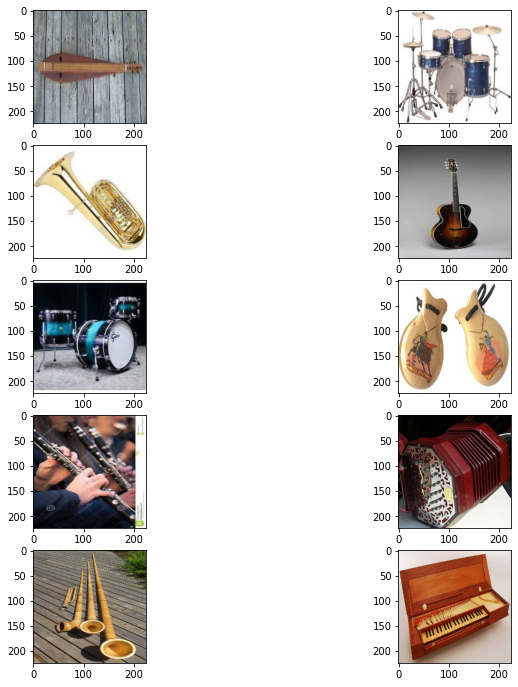

In [ ]:
files = list((new_train).rglob("*.jpg"))
files_to_show = np.random.choice(files, 10, replace=False)
fig, ax = plt.subplots(5, 2)
fig.set_figwidth(12)
fig.set_figheight(12)
for i, file in enumerate(files_to_show):
    row_id = i // 2
    col_id = i % 2
    img = np.array(Image.open(file))
    ax[row_id, col_id].imshow(img)

## Генераторы

In [ ]:
BATCH_SIZE = 32

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

valid_test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    directory=TRAIN_DATA_DIR,
    target_size=(INPUT_HEIGHT, INPUT_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=42
)

valid_generator = valid_test_datagen.flow_from_directory(
    directory=VALID_DATA_DIR,
    target_size=(INPUT_HEIGHT, INPUT_WIDTH),
    batch_size=1,
    class_mode="categorical",
    shuffle=False
)

Found 3064 images belonging to 7 classes.
Found 2035 images belonging to 7 classes.


## Модель

In [ ]:
# initialize model
backbone = VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(INPUT_HEIGHT, INPUT_WIDTH, INPUT_CHANNELS)
)

backbone.trainable = False

2021-11-25 16:51:35.997935: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-11-25 16:51:36.617163: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:05:00.0 name: NVIDIA GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.91GiB deviceMemoryBandwidth: 451.17GiB/s
2021-11-25 16:51:36.618070: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 1 with properties: 
pciBusID: 0000:06:00.0 name: NVIDIA GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2021-11-25 16:51:36.618953: I tensorflow/core/common_runtime/gpu/gpu_dev

In [ ]:
model = models.Sequential()
model.add(backbone)
model.add(layers.Flatten())
model.add(layers.Dense(NUM_CLASSES, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 7)                 175623    
Total params: 14,890,311
Trainable params: 175,623
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
len(model.trainable_weights)

2

## Обучение

In [ ]:
LEARNING_RATE = 1e-3
NUM_EPOCHS = 3

In [ ]:
model.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
    metrics=["accuracy"]
)

In [ ]:
history = model.fit(
    train_generator,
    epochs=NUM_EPOCHS,
    validation_data=valid_generator
)

2021-11-25 16:51:38.560331: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-11-25 16:51:38.580341: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3597915000 Hz


Epoch 1/3


2021-11-25 16:51:39.322410: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2021-11-25 16:51:39.581794: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8201
2021-11-25 16:51:39.835901: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-11-25 16:51:39.835970: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2021-11-25 16:51:39.836821: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2021-11-25 16:51:39.836939: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2021-11-25 16:51:39.987983: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully ope

96/96 [==============================] - 45s 424ms/step - loss: 0.5702 - accuracy: 0.8678 - val_loss: 0.2897 - val_accuracy: 0.9106
Epoch 2/3
96/96 [==============================] - 38s 399ms/step - loss: 0.2819 - accuracy: 0.9122 - val_loss: 0.2736 - val_accuracy: 0.9076
Epoch 3/3
96/96 [==============================] - 38s 397ms/step - loss: 0.2602 - accuracy: 0.9181 - val_loss: 0.1520 - val_accuracy: 0.9509


In [ ]:
model.save("checkpoint.h5")

## Оценка

In [ ]:
model.trainable = False

In [ ]:
y_true = valid_generator.classes
y_pred = model.predict(valid_generator)

print(classification_report(y_true, y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.95      0.72      0.82        54
           1       0.83      0.76      0.79        50
           2       0.86      0.78      0.82        49
           3       0.98      0.93      0.95        54
           4       0.97      0.98      0.97      1723
           5       0.64      0.80      0.71        51
           6       0.86      0.91      0.88        54

    accuracy                           0.95      2035
   macro avg       0.87      0.84      0.85      2035
weighted avg       0.95      0.95      0.95      2035



## Выбор примеров для анализа

In [ ]:
most_pop_label = 6  # соответствует классу "saxaphone"

In [ ]:
predict_probas = y_pred[:, most_pop_label]
predicts = y_pred.argmax(1)

In [ ]:
pos_right_idxs = np.where((predicts == most_pop_label) & (y_true == most_pop_label))[0]
neg_right_idxs = np.where((predicts != most_pop_label) & (y_true != most_pop_label))[0]
pos_wrong_idxs = np.where((predicts == most_pop_label) & (y_true != most_pop_label))[0]
neg_wrong_idxs = np.where((predicts != most_pop_label) & (y_true == most_pop_label))[0]

probas_pos_right = predict_probas[pos_right_idxs]
probas_neg_right = predict_probas[neg_right_idxs]
probas_pos_wrong = predict_probas[pos_wrong_idxs]
probas_neg_wrong = predict_probas[neg_wrong_idxs]

best_probas_pos_right_id = pos_right_idxs[probas_pos_right.argmax()]
worst_probas_pos_right_id = pos_right_idxs[probas_pos_right.argmin()]

best_probas_neg_right_id = neg_right_idxs[probas_neg_right.argmin()]
worst_probas_neg_right_id = neg_right_idxs[probas_neg_right.argmax()]

best_probas_pos_wrong_id = pos_wrong_idxs[probas_pos_wrong.argmin()]
worst_probas_pos_wrong_id = pos_wrong_idxs[probas_pos_wrong.argmax()]

best_probas_neg_wrong_id = neg_wrong_idxs[probas_neg_wrong.argmax()]
worst_probas_neg_wrong_id = neg_wrong_idxs[probas_neg_wrong.argmin()]

In [ ]:
best_probas_pos_right = valid_generator[best_probas_pos_right_id][0].copy()
worst_probas_pos_right = valid_generator[worst_probas_pos_right_id][0].copy()

best_probas_neg_right = valid_generator[best_probas_neg_right_id][0].copy()
worst_probas_neg_right = valid_generator[worst_probas_neg_right_id][0].copy()

best_probas_pos_wrong = valid_generator[best_probas_pos_wrong_id][0].copy()
worst_probas_pos_wrong = valid_generator[worst_probas_pos_wrong_id][0].copy()

best_probas_neg_wrong = valid_generator[best_probas_neg_wrong_id][0].copy()
worst_probas_neg_wrong = valid_generator[worst_probas_neg_wrong_id][0].copy()

`best_probas_pos_right` соответствует правильно классифицированному примеру с *наиболее высокой* вероятностью принадлежности к классу; аналогично для `worst_probas_pos_right`, `best_probas_neg_right` и `worst_probas_neg_right`; для неправильно классифицированных примеров имена инвертированы: например, `best_probas_pos_wrong` соответствует правильно классифицированному примеру с *наиболее низкой* вероятностью принадлежности к классу.

# 2 Анализ с помощью LIME и SHAP

## 2.1 SHAP

In [ ]:
to_explain = [
    best_probas_pos_right,
    worst_probas_pos_right,
    best_probas_neg_right,
    worst_probas_neg_right,
    best_probas_pos_wrong,
    worst_probas_pos_wrong,
    best_probas_neg_wrong,
    worst_probas_neg_wrong
]

In [ ]:
image_names = [
    "best_probas_pos_right",
    "worst_probas_pos_right",
    "best_probas_neg_right",
    "worst_probas_neg_right",
    "best_probas_pos_wrong",
    "worst_probas_pos_wrong",
    "best_probas_neg_wrong",
    "worst_probas_neg_wrong"
]

In [ ]:
background = []
class_count = defaultdict(int)
for i in range(len(train_generator)):
    images, labels = train_generator[i]
    for i, label in enumerate(labels):
        label = np.argmax(label)
        if class_count[label] < 4:
            background.append(images[i:i + 1])
            class_count[label] += 1
    if len(class_count) == NUM_CLASSES and all([class_count[label] == 4 for label in range(7)]):
        break

In [ ]:
explainer = shap.DeepExplainer(model, np.concatenate(background, axis=0))

keras is no longer supported, please use tf.keras instead.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


In [ ]:
class_names = list(train_generator.class_indices.keys())

In [ ]:
def explain_with_shap(experiment_name: str) -> None:
    index = image_names.index(experiment_name)
    shap_values = explainer.shap_values(to_explain[index])
    shap.image_plot(shap_values, to_explain[index], width=20, labels=class_names)

### Правильно классифицированные примеры с высокой вероятностью принадлежности к классу

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


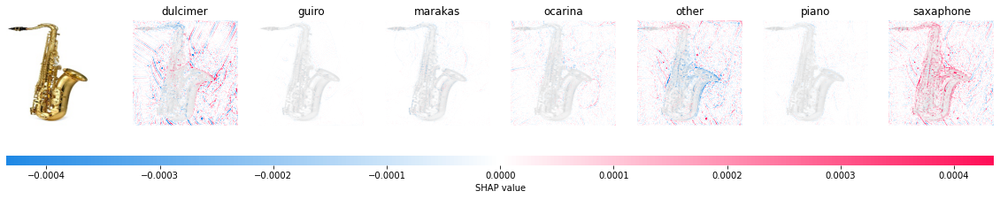

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("best_probas_pos_right")

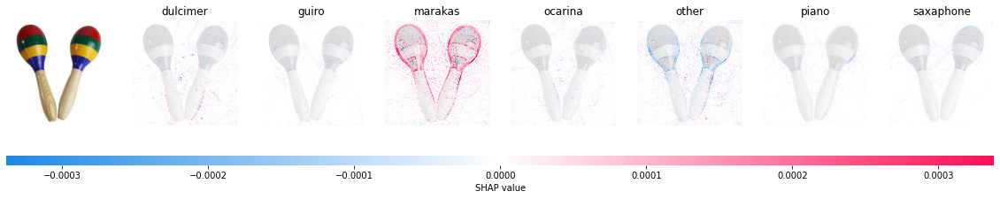

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("best_probas_neg_right")

В **правильно** классифицированных примерах с **высокой** вероятностью принадлежности к классу на карте признаков соответствующего класса преобладают высокие положительные значения SHAP-value.

### Правильно классифицированные примеры с низкой вероятностью принадлежности к классу

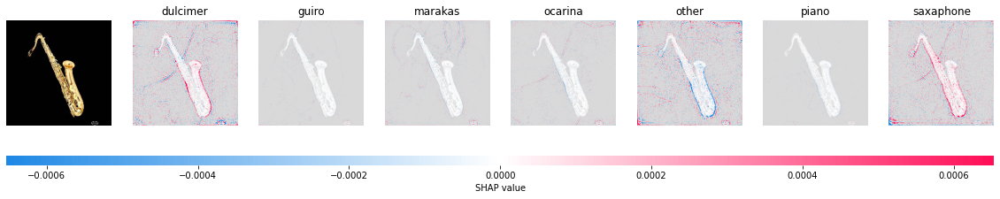

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("worst_probas_pos_right")

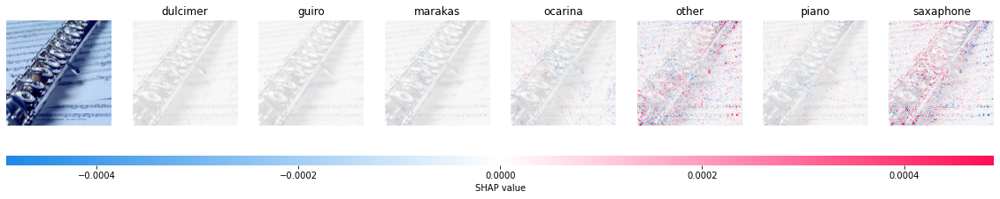

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("worst_probas_neg_right")

В **правильно** классифицированных примерах с **низкой** вероятностью принадлежности к классу на карте признаков соответствующего класса положительные и отрицательные значения SHAP-value представлены приблизительно в равных пропорциях.

### Неправильно классифицированные примеры с высокой вероятностью принадлежности к классу

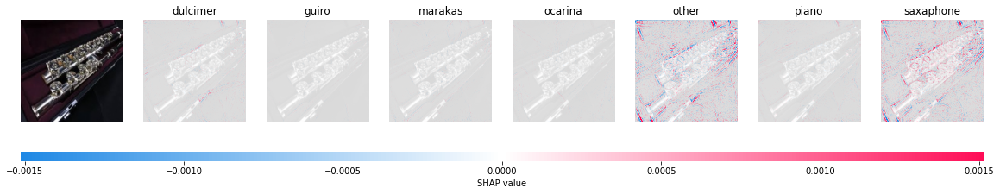

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("worst_probas_pos_wrong")

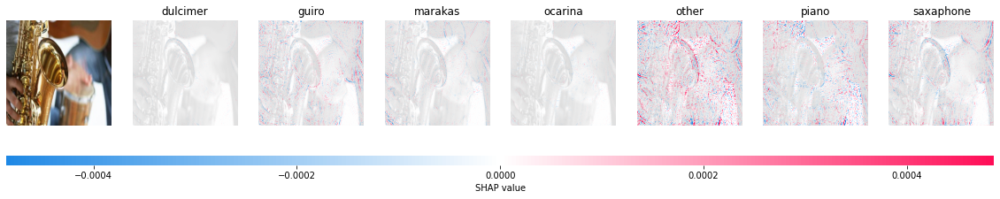

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("worst_probas_neg_wrong")

В **неправильно** классифицированных примерах с **высокой** вероятностью принадлежности к классу на карте признаков другого, несоответствующего класса преобладают высокие положительные значения SHAP-value.

### Неправильно классифицированные примеры с низкой вероятностью принадлежности к классу

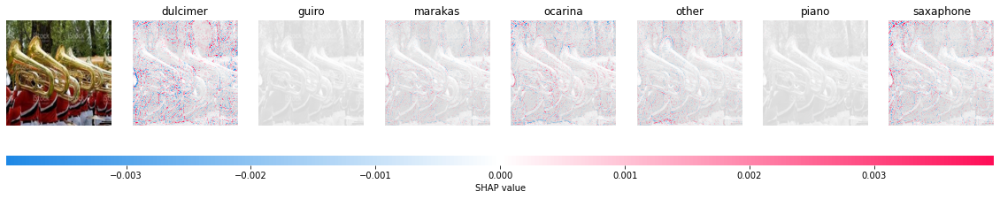

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("best_probas_pos_wrong")

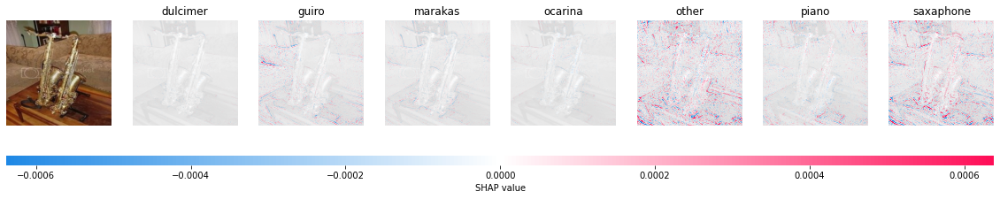

In [ ]:
with tf.device('/CPU:0'):
    explain_with_shap("best_probas_neg_wrong")

В **неправильно** классифицированных примерах с **низкой** вероятностью принадлежности к классу на карте признаков другого, несоответствующего класса положительные и отрицательные значения SHAP-value представлены приблизительно в равных пропорциях.

## 2.2 LIME

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
def explain_with_lime(experiment_name: str) -> None:
    index = image_names.index(experiment_name)
    explanation = explainer.explain_instance(
        to_explain[index].reshape(224, 224, 3).astype("double"),
        model.predict,
        top_labels=7,
        hide_color=0
    )
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=False,
        num_features=10,
        hide_rest=False
    )
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

### Правильно классифицированные примеры с высокой вероятностью принадлежности к классу

  0%|          | 0/1000 [00:00<?, ?it/s]

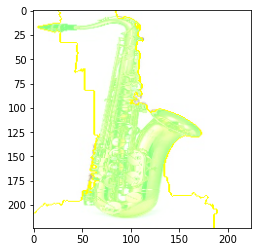

In [ ]:
explain_with_lime("best_probas_pos_right")

  0%|          | 0/1000 [00:00<?, ?it/s]

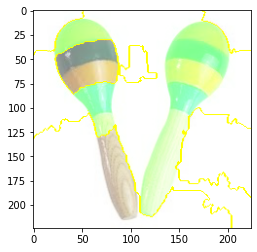

In [ ]:
explain_with_lime("best_probas_neg_right")

У **правильно** классифицированных примеров с **высокой** вероятностью принадлежности к классу на карте признаков видно, что основные признаки сосредоточенны вокруг инструмента, как и ожидается.

### Правильно классифицированные примеры с низкой вероятностью принадлежности к классу

  0%|          | 0/1000 [00:00<?, ?it/s]

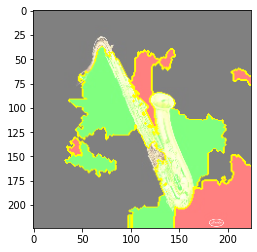

In [ ]:
explain_with_lime("worst_probas_pos_right")

  0%|          | 0/1000 [00:00<?, ?it/s]

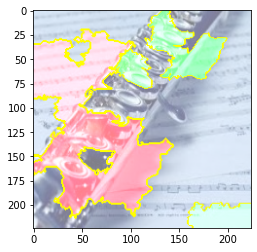

In [ ]:
explain_with_lime("worst_probas_neg_right")

У **правильно** классифицированных примеров с **низкой** вероятностью принадлежности к классу на карте признаков видно, что основные признаки сосредоточенны не только вокруг инструмента, но и захватывают значительную часть заднего фона.

### Неправильно классифицированные примеры с высокой вероятностью принадлежности к классу

  0%|          | 0/1000 [00:00<?, ?it/s]

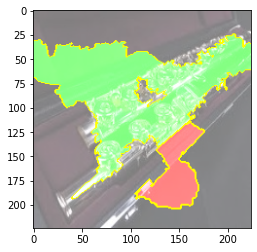

In [ ]:
explain_with_lime("worst_probas_pos_wrong")

  0%|          | 0/1000 [00:00<?, ?it/s]

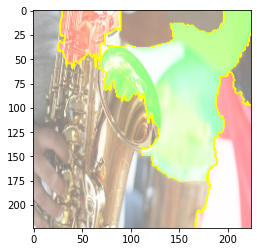

In [ ]:
explain_with_lime("worst_probas_neg_wrong")

У **неправильно** классифицированных примеров с **высокой** вероятностью принадлежности к классу на карте признаков большое внимание уделяется в большей мере частям инструмента, не позволяющим правильно его классифицировать, и в меньшей — заднему фону.

### Неправильно классифицированные примеры с низкой вероятностью принадлежности к классу

  0%|          | 0/1000 [00:00<?, ?it/s]

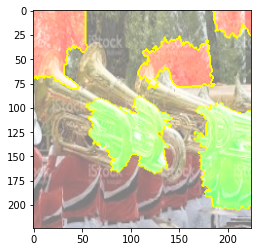

In [ ]:
explain_with_lime("best_probas_pos_wrong")

  0%|          | 0/1000 [00:00<?, ?it/s]

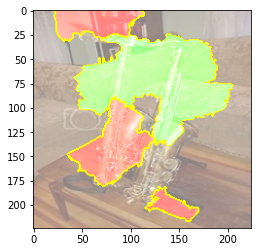

In [ ]:
explain_with_lime("best_probas_neg_wrong")

У **неправильно** классифицированных примеров с **низкой** вероятностью принадлежности к классу на карте признаков большое внимание уделяется в большей мере заднему фону, в меньшей — несвязанным между собой частям инструмента.

## 2.3 Выводы

В целом, для отобранных примеров методы SHAP и LIME дают схожие объяснения, но по субъективным ощущениям объяснения, которые даёт LIME, более интерпретируемы, чем те, которые даёт SHAP.

# 3 Gradients, Signals, Attribution methods

## 3.1 Gradients

In [ ]:
backbone = model.layers[0]

LAYER_NAME = "block5_conv3"

gb_model = tf.keras.models.Model(
    inputs=[backbone.inputs],    
    outputs=[backbone.get_layer(LAYER_NAME).output]
)
layer_dict = [layer for layer in gb_model.layers[1:] if hasattr(layer, "activation")]


@tf.custom_gradient
def guidedRelu(x):
    def grad(dy):
        return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad


@tf.custom_gradient
def Grad(x):
    def grad(dy):
        return tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad

In [ ]:
def process_image(img, gradient):
    for layer in layer_dict:
        if layer.activation == tf.keras.activations.relu:
            layer.activation = gradient

    with tf.GradientTape() as tape:
        inputs = tf.cast(img, tf.float32)
        tape.watch(inputs)
        outputs = gb_model(inputs)[0]
    grads = tape.gradient(outputs, inputs)[0]

    guided_back_prop = grads
    gb_viz = np.dstack((
        guided_back_prop[:, :, 0],
        guided_back_prop[:, :, 1],
        guided_back_prop[:, :, 2],
    )) 

    gb_viz -= np.min(gb_viz)
    gb_viz /= gb_viz.max()
    return gb_viz

### 3.1.1 Правильно классифицированные примеры с высокой вероятностью принадлежности к классу

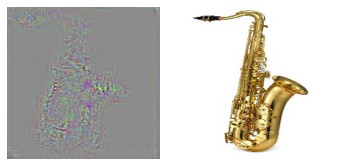

In [ ]:
image = best_probas_pos_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

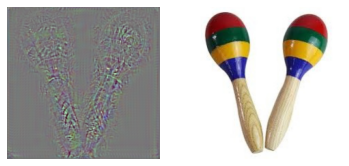

In [ ]:
image = best_probas_neg_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

### 3.1.2 Правильно классифицированные примеры с низкой вероятностью принадлежности к классу

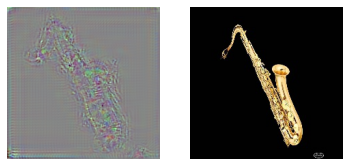

In [ ]:
image = worst_probas_pos_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

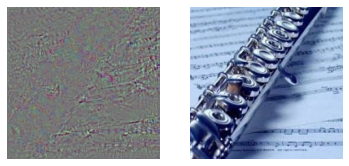

In [ ]:
image = worst_probas_neg_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

### 3.1.3 Неправильно классифицированные примеры с низкой вероятностью принадлежности к классу

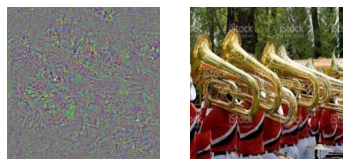

In [ ]:
image = best_probas_pos_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

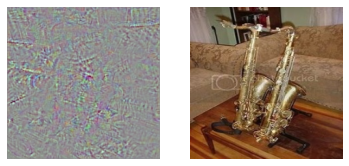

In [ ]:
image = best_probas_neg_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

### 3.1.4 Неправильно классифицированные примеры с высокой вероятностью принадлежности к классу

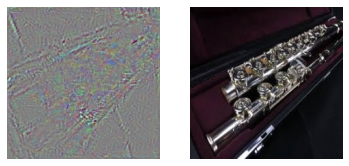

In [ ]:
image = worst_probas_pos_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

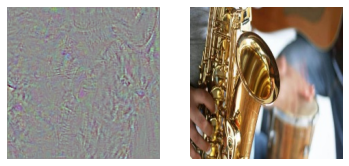

In [ ]:
image = worst_probas_neg_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, Grad))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

## 3.2 Signals — Guided Backpropagation

In [ ]:
model = load_model("checkpoint.h5")
backbone = model.layers[0]

LAYER_NAME = "block5_conv3"

gb_model = tf.keras.models.Model(
    inputs=[backbone.inputs],    
    outputs=[backbone.get_layer(LAYER_NAME).output]
)
layer_dict = [layer for layer in gb_model.layers[1:] if hasattr(layer, "activation")]

### 3.2.1 Правильно классифицированные примеры с высокой вероятностью принадлежности к классу

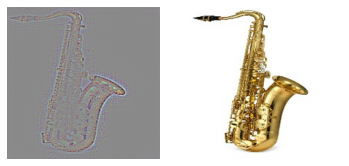

In [ ]:
image = best_probas_pos_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

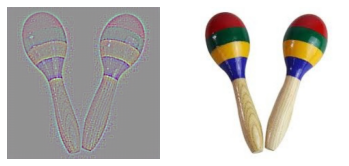

In [ ]:
image = best_probas_neg_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

### 3.2.2 Правильно классифицированные примеры с низкой вероятностью принадлежности к классу

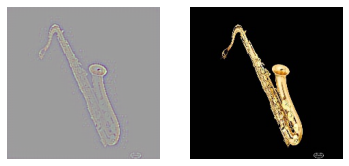

In [ ]:
image = worst_probas_pos_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

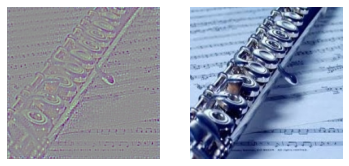

In [ ]:
image = worst_probas_neg_right
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

### 3.2.3 Неправильно классифицированные примеры с низкой вероятностью принадлежности к классу

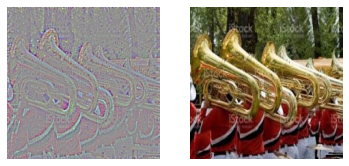

In [ ]:
image = best_probas_pos_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

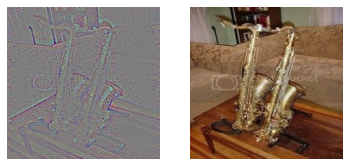

In [ ]:
image = best_probas_neg_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

### 3.2.4 Неправильно классифицированные примеры с высокой вероятностью принадлежности к классу

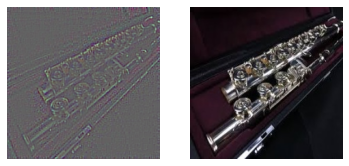

In [ ]:
image = worst_probas_pos_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

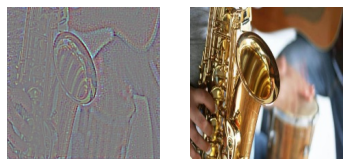

In [ ]:
image = worst_probas_neg_wrong
fig, ax = plt.subplots(1, 2)
ax[0].imshow(process_image(image, guidedRelu))
ax[0].axis("off")
ax[1].imshow(image.squeeze())
ax[1].axis("off");

## 3.3 Attribution methods — Integrated gradients

In [ ]:
baseline = tf.zeros(shape=(224, 224, 3))

In [ ]:
def interpolate_images(
    baseline,
    image,
    alphas
):
    alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
    baseline_x = tf.expand_dims(baseline, axis=0)
    input_x = tf.expand_dims(image, axis=0)
    delta = input_x - baseline_x
    images = baseline_x +  alphas_x * delta
    return images

In [ ]:
def compute_gradients(images, target_class_idx):
    with tf.GradientTape() as tape:
        tape.watch(images)
        logits = model(images)
        probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
    return tape.gradient(probs, images)


def integral_approximation(gradients):
    # riemann_trapezoidal
    grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
    integrated_gradients = tf.math.reduce_mean(grads, axis=0)
    return integrated_gradients

In [ ]:
@tf.function
def integrated_gradients(
    baseline,
    image,
    target_class_idx,
    m_steps=50,
    batch_size=1
):
    alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

    gradient_batches = tf.TensorArray(tf.float32, size=m_steps+1)

    # Iterate alphas range and batch computation for speed, memory #efficiency, and scaling to larger m_steps.
    for alpha in tf.range(0, len(alphas), batch_size):
        from_ = alpha
        to = tf.minimum(from_ + batch_size, len(alphas))
        alpha_batch = alphas[from_:to]# 2. Generate interpolated inputs between baseline and input.

        # 2. Generate interpolated inputs between baseline and input.
        interpolated_path_input_batch = interpolate_images(
            baseline=baseline,
            image=image,
            alphas=alpha_batch
        )

        # 3. Compute gradients between model outputs and interpolated inputs.
        gradient_batch = compute_gradients(
            images=interpolated_path_input_batch,
            target_class_idx=target_class_idx
        )

        # Write batch indices and gradients to extend TensorArray.
        gradient_batches = gradient_batches.scatter(tf.range(from_, to), gradient_batch)    

    # Stack path gradients together row-wise into single tensor.
    total_gradients = gradient_batches.stack()

    # 4. Integral approximation through averaging gradients.
    avg_gradients = integral_approximation(gradients=total_gradients)

    # 5. Scale integrated gradients with respect to input.
    integrated_gradients = (image - baseline) * avg_gradients
    return integrated_gradients

In [ ]:
def plot_img_attributions(baseline,
                          image,
                          target_class_idx,
                          m_steps=50,
                          cmap=None,
                          overlay_alpha=0.4):

    attributions = integrated_gradients(
        baseline=baseline,
        image=image,
        target_class_idx=target_class_idx,
        m_steps=m_steps
    )

    attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)

    fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))

    axs[0, 0].set_title('Baseline image')
    axs[0, 0].imshow(baseline)
    axs[0, 0].axis('off')

    axs[0, 1].set_title('Original image')
    axs[0, 1].imshow(image)
    axs[0, 1].axis('off')

    axs[1, 0].set_title('Attribution mask')
    axs[1, 0].imshow(attribution_mask, cmap=cmap)
    axs[1, 0].axis('off')

    axs[1, 1].set_title('Overlay')
    axs[1, 1].imshow(attribution_mask, cmap=cmap)
    axs[1, 1].imshow(image, alpha=overlay_alpha)
    axs[1, 1].axis('off')

    plt.tight_layout()

### 3.3.1 Правильно классифицированные примеры с высокой вероятностью принадлежности к классу

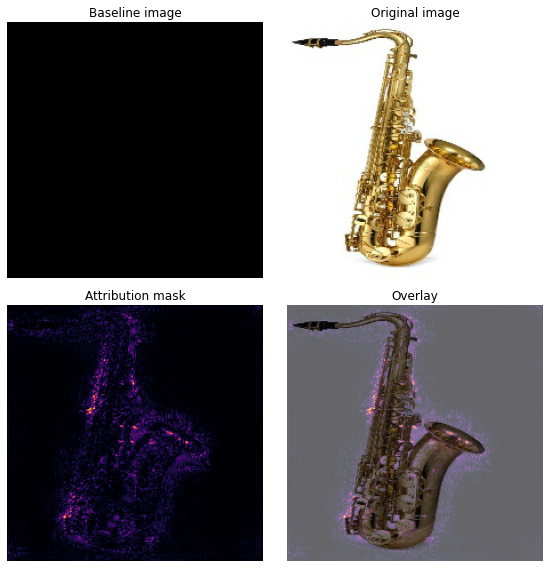

In [ ]:
model = load_model("checkpoint.h5")

plot_img_attributions(
    image=best_probas_pos_right[0],
    baseline=baseline,
    target_class_idx=y_true[best_probas_pos_right_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

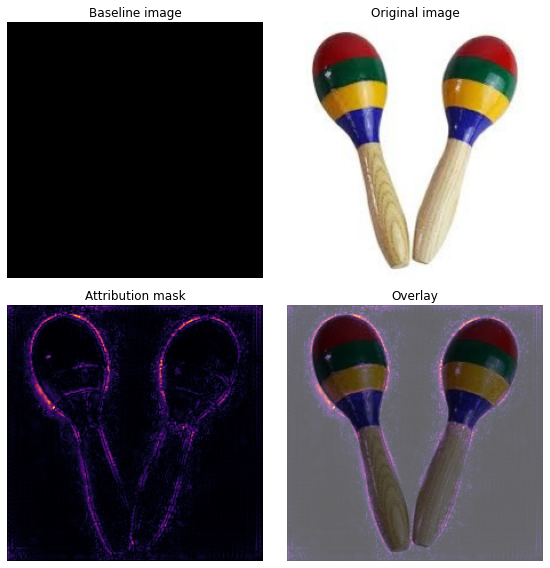

In [ ]:
plot_img_attributions(
    image=best_probas_neg_right[0],
    baseline=baseline,
    target_class_idx=y_true[best_probas_neg_right_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

### 3.3.2 Правильно классифицированные примеры с низкой вероятностью принадлежности к классу

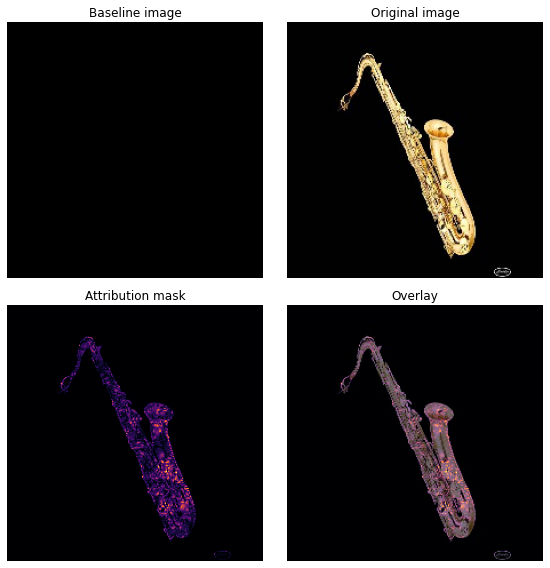

In [ ]:
plot_img_attributions(
    image=worst_probas_pos_right[0],
    baseline=baseline,
    target_class_idx=y_true[worst_probas_pos_right_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

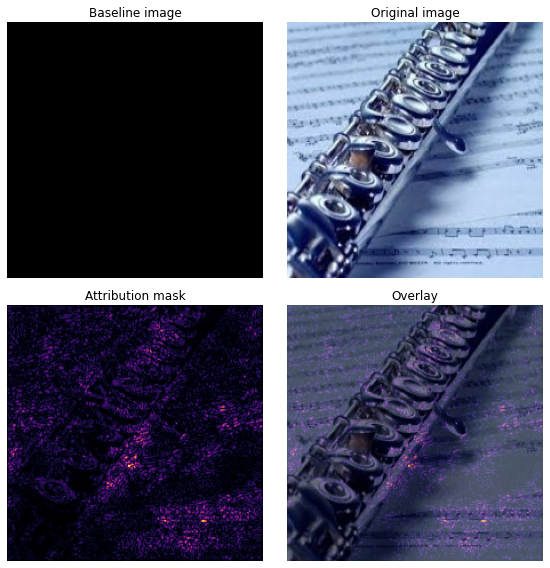

In [ ]:
plot_img_attributions(
    image=worst_probas_neg_right[0],
    baseline=baseline,
    target_class_idx=y_true[worst_probas_neg_right_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

### 3.3.3 Неправильно классифицированные примеры с низкой вероятностью принадлежности к классу

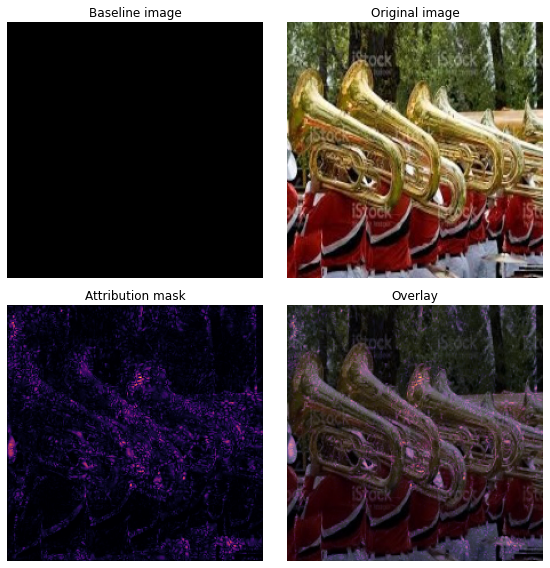

In [ ]:
plot_img_attributions(
    image=best_probas_pos_wrong[0],
    baseline=baseline,
    target_class_idx=y_true[best_probas_pos_wrong_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

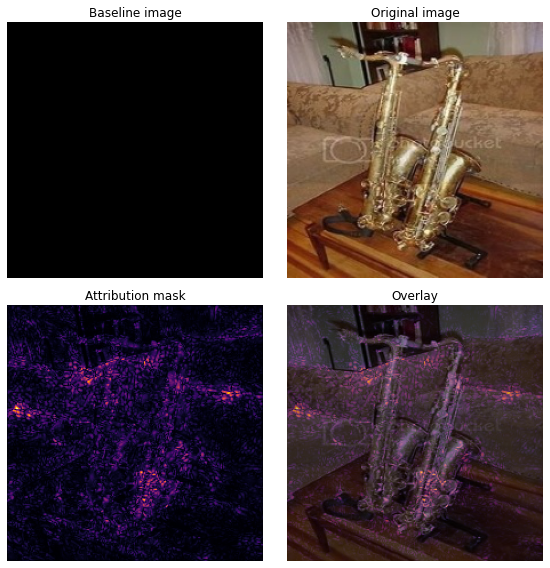

In [ ]:
plot_img_attributions(
    image=best_probas_neg_wrong[0],
    baseline=baseline,
    target_class_idx=y_true[best_probas_neg_wrong_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

### 3.3.4 Неправильно классифицированные примеры с высокой вероятностью принадлежности к классу

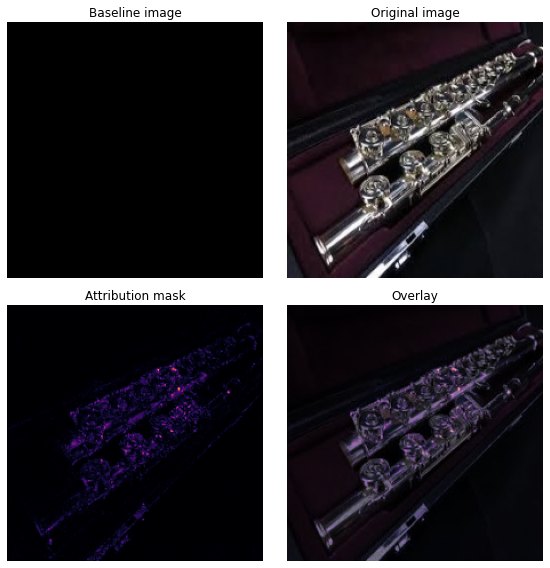

In [ ]:
plot_img_attributions(
    image=worst_probas_pos_wrong[0],
    baseline=baseline,
    target_class_idx=y_true[worst_probas_pos_wrong_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

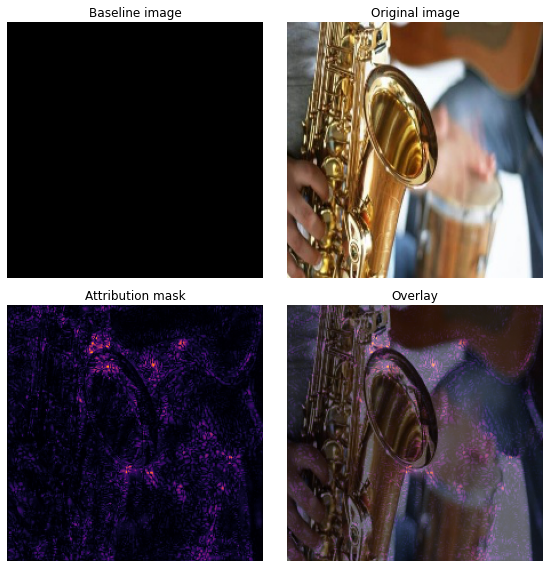

In [ ]:
plot_img_attributions(
    image=worst_probas_neg_wrong[0],
    baseline=baseline,
    target_class_idx=y_true[worst_probas_neg_wrong_id],
    m_steps=240,
    cmap=plt.cm.inferno,
    overlay_alpha=0.4
)

## 3.4 Выводы

Результаты всех трёх методов довольно похожи по результатам (для примеров с высокой вероятностью принадлежности к классу признаки сосредоточены в основном на объекте, с низкой вероятностью — сильно захватывают задний фон), но отличаются по степени интерпретируемости: лучше всего интерпретируются результаты методов Guided Backpropagation и Integrated Gradients, хуже — Gradients.

Сравнивая методы этих групп с SHAP и LIME, можно сказать, что их результаты довольно похожи. Правда, с SHAP сравнение проводить сложнее, поскольку SHAP при классификации с низкой вероятностью принадлежности к классу распределяет своё внимание на объекты разных классов.

# 4 Counterfactual examples

In [ ]:
tf.compat.v1.disable_eager_execution()

In [ ]:
shape = (1, INPUT_HEIGHT, INPUT_WIDTH, 3)
target_proba = 1.0
tol = 0.3
target_class = "other"
max_iter = 1000
lam_init = 1e-2 
max_lam_steps = 10
learning_rate_init = 0.1 
feature_range = (0,1)
loaded_model = load_model("checkpoint.h5")

cf = Counterfactual(loaded_model, shape=shape, target_proba=target_proba, tol=tol,
                    target_class=target_class, max_iter=max_iter, lam_init=lam_init,
                    max_lam_steps=max_lam_steps, learning_rate_init=learning_rate_init,
                    feature_range=feature_range)
 

In [ ]:
def get_counterfactual_example(experiment_name: str):
    index = image_names.index(experiment_name)
    value = to_explain[index]
    explanation = cf.explain(value)
    if explanation:
        fig, axs = plt.subplots(1, 3, figsize=(15,5))
        axs[0].imshow(value[0])
        axs[1].imshow(explanation.cf["X"][0])
        axs[2].imshow(7*np.abs(value[0]-explanation.cf['X'][0]))
        axs[0].set_title("Original class: {}".format(class_names[explanation["orig_class"]]))
        axs[1].set_title("Counterfactual prediction: {}".format(class_names[explanation.cf["class"]]))
        axs[2].set_title("The difference between them (multiplied by 7)");
    else:
        print("There is no counterfactual examples for image")

## 4.1 Правильно классифицированные примеры с высокой вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


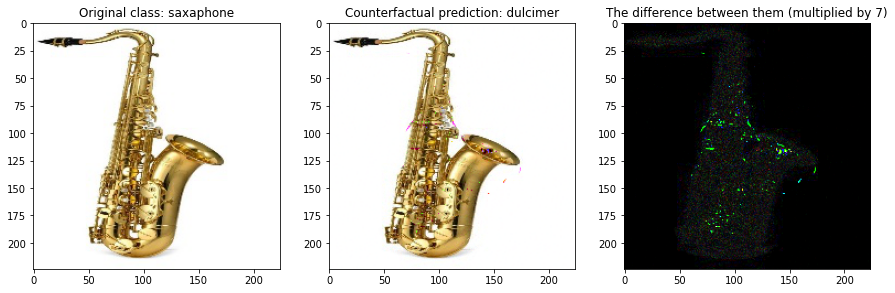

In [ ]:
get_counterfactual_example("best_probas_pos_right")

Для второго правильно классифицированного примера с наибольшей (топ-1) вероятностью принадлежности к классу не нашлось контрфактического примера, поэтому пришлось использовать пример с топ-2 вероятностью:

The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


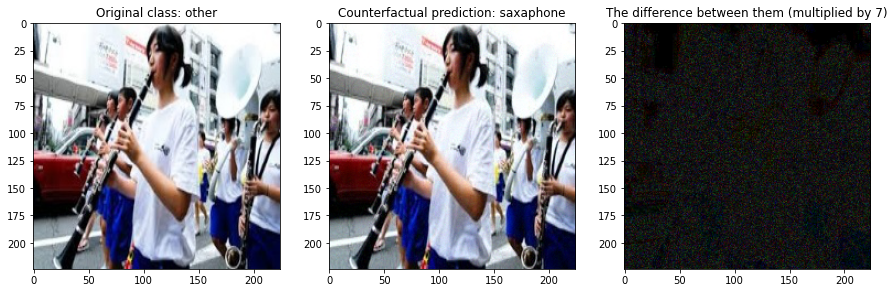

In [ ]:
best_probas_neg_right_id_second = neg_right_idxs[probas_neg_right.argsort()[-2]]
best_probas_neg_right_second = valid_generator[best_probas_neg_right_id_second][0].copy()
explanation = cf.explain(best_probas_neg_right_second)
fig, axs = plt.subplots(1, 3, figsize=(15,5))
axs[0].imshow(best_probas_neg_right_second[0])
axs[1].imshow(explanation.cf["X"][0])
axs[2].imshow(7*np.abs(best_probas_neg_right_second[0]-explanation.cf["X"][0]))
axs[0].set_title("Original class: {}".format(class_names[explanation["orig_class"]]))
axs[1].set_title("Counterfactual prediction: {}".format(class_names[explanation.cf["class"]]))
axs[2].set_title("The difference between them (multiplied by 7)");

Как и ожидалось, для сложных примеров *counterfactual examples* практически не отличаются от *adversarial examples*. Для **правильно** классифицированных примеров с **высокой** вероятностью принадлежности к классу *counterfactual example* соответствует нечёткой картинке объекта. При этом нечёткость в основном может относиться как к самому объекту (пример 1), так и к заднему фону (пример 2), и является достаточно заметной.

## 4.2 Правильно классифицированные примеры с низкой вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


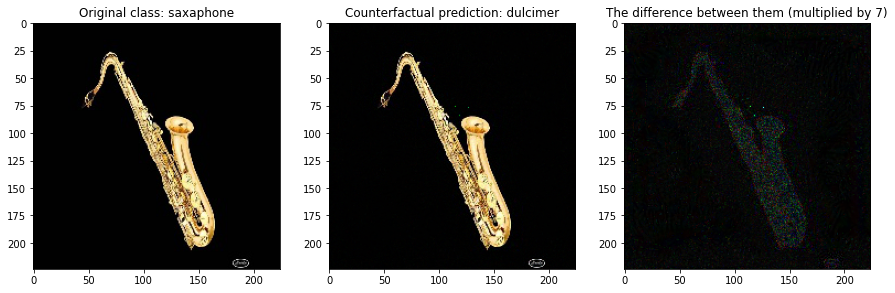

In [ ]:
get_counterfactual_example("worst_probas_pos_right")

The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


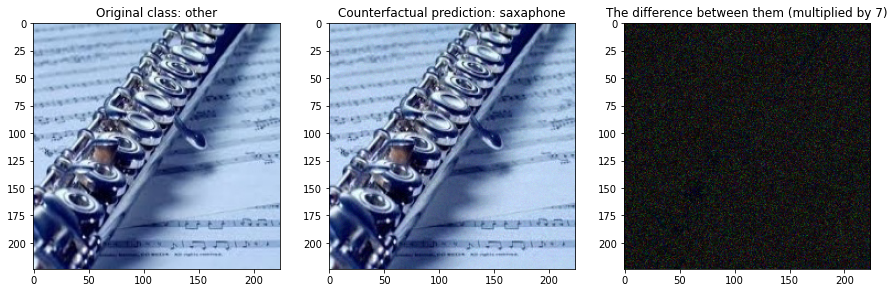

In [ ]:
get_counterfactual_example("worst_probas_neg_right")

Для **правильно** классифицированных примеров с **низкой** вероятностью принадлежности к классу *counterfactual example* и оригинальное изображение практически не отличаются (пример 2), либо очень слабо отличаются задним фоном (пример 1).

## 4.3 Неправильно классифицированные примеры с высокой вероятностью принадлежности к классу

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


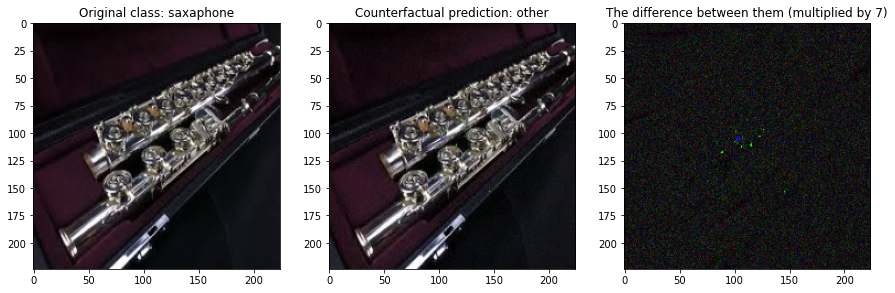

In [ ]:
get_counterfactual_example("worst_probas_pos_wrong")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


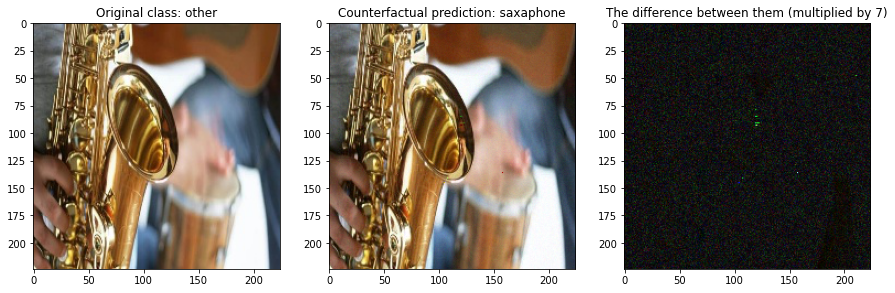

In [ ]:
get_counterfactual_example("worst_probas_neg_wrong")

Для **неправильно** классифицированных примеров с **высокой** вероятностью принадлежности классу видно очень слабое отличие *counterfactual example* от оригинального изображения, причём отличие может касаться как самого объекта, так и его заднего фона. Заметим, что для *counterfactual example* получен правильный класс принадлежности.

## 4.4 Неправильно классифицированные примеры с низкой вероятностью принадлежности к классу

The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


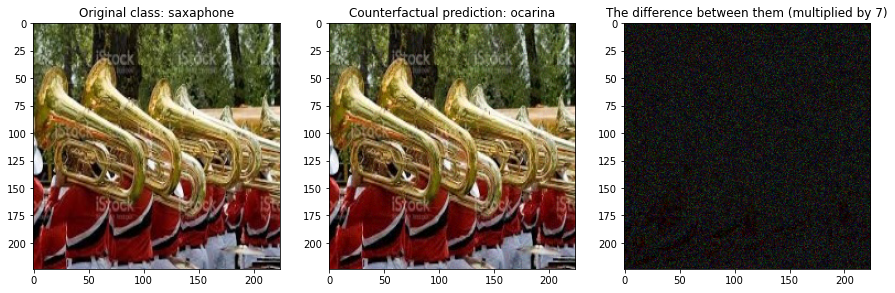

In [ ]:
get_counterfactual_example("best_probas_pos_wrong")

The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.


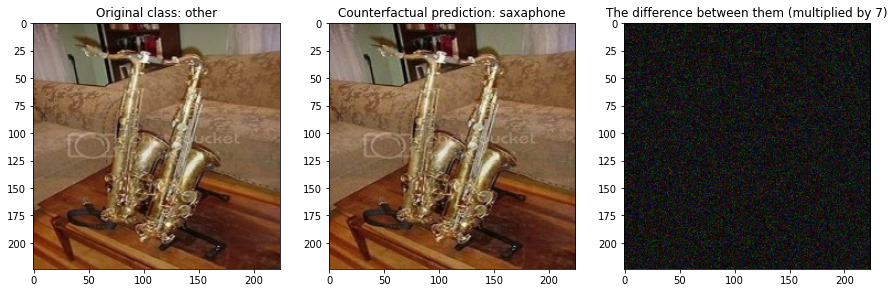

In [ ]:
get_counterfactual_example("best_probas_neg_wrong")

Для **неправильно** классифицированных примеров с **низкой** вероятностью принадлежности к классу не видно сколь-нибудь заметного отличия между   *counterfactual example* и оригинальным изображением. Как и в предыдущем случае, получен правильный класс принадлежности для *counterfactual example*.

## 4.5 Выводы

Результаты не очень интуитивно понятны, поскольку изменения пикселей изображений насколько незначительны, что отличить исходное изображение от контрфактического примера невозможно. Для изображений без заднего фона (с однотонным фоном) изменения касаются только самого объекта (за исключением нескольких пикселей), для изображений с фоном — преобразуются пиксели всего изображения.

# 5 Выводы

В нашем случае наиболее интуитивно достоверные результаты показали методы LIME, Guided Backpropagation и Integrated Gradients: эти методы наиболее чётко показывают участки, на которые модель обращает внимание, что облегчает процесс интерпретации.